# <font color = 'tomato'>Image Segmentation with Multi-Temporal RS Images Based on Fusion MRFs</font>

In [1]:
# Fusion MRFs is used for image segementation.
# Classes: Cloud, Cloud_Shadow, Haze, Clear_region, Others.\
# L2A_20210708 is totally cloud free
# First Step: Only test on R60m and L2A and S2A RS images.

## Kmeans for image segmentation

In [68]:
import cv2
import numpy as np
from glob import glob
import earthpy.plot as ep
import matplotlib.pyplot as plt
import rasterio as rio


from sklearn import cluster
from osgeo import gdal, gdal_array

# Tell GDAL to throw Python exceptions, and register all drivers
gdal.UseExceptions()
gdal.AllRegister()


In [145]:
# Load Sentinel Data
S_sentinel_bands = glob("/home/morin/morui/RESO/Code/Satellite_Imagery_Analysis-main/Data/L2A_data/S2A*.SAFE/GRANULE/L2A_*/IMG_DATA/R60m/*B?*.jp2")
S_sentinel_bands.sort()
len(S_sentinel_bands)/11

23.0

In [146]:
sentinel_bands_dict= {}

for i in range(int(len(S_sentinel_bands)/11)):
    sensor_date = S_sentinel_bands[i*11][-27:-19]
    l = []
    for j in S_sentinel_bands[i*11 : (i*11 + 11)]:
        with rio.open(j, 'r') as f:
            l.append(f.read(1))

    arr_st = np.stack(l)
    sentinel_bands_dict[str(sensor_date)] = arr_st

In [147]:
sentinel_bands_dict.keys()

dict_keys(['20210404', '20210424', '20210504', '20210603', '20210613', '20210623', '20210713', '20210723', '20210802', '20210812', '20210822', '20210911', '20210921', '20211031', '20211120', '20211130', '20211220', '20220109', '20220119', '20220129', '20220208', '20220218', '20220310'])

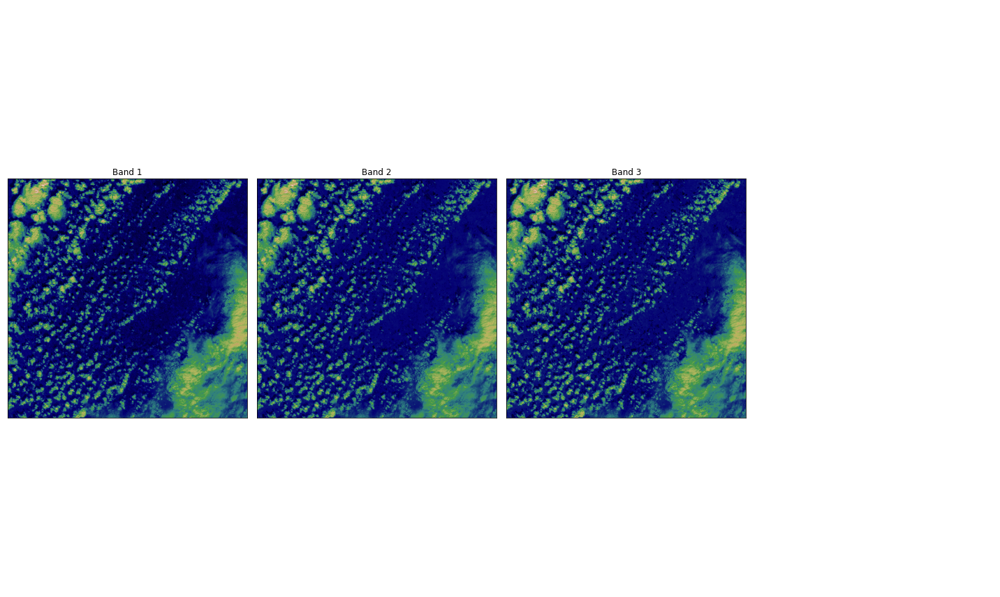

In [148]:
ep.plot_bands(sentinel_bands_dict['20210404'][1:4], cmap = 'gist_earth', figsize = (20, 12), cols = 4, cbar = False)
plt.show()

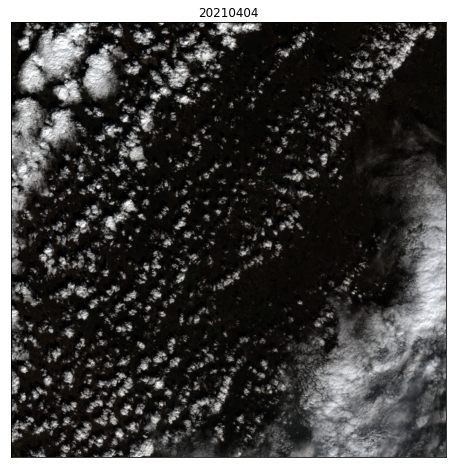

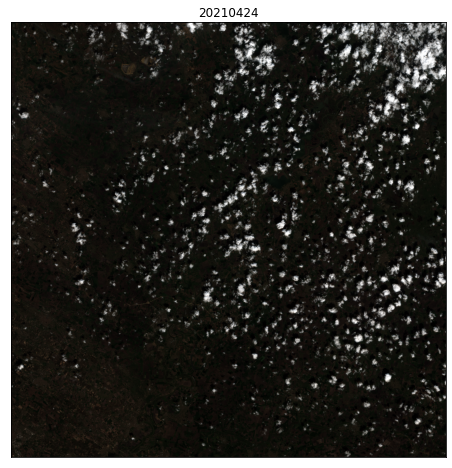

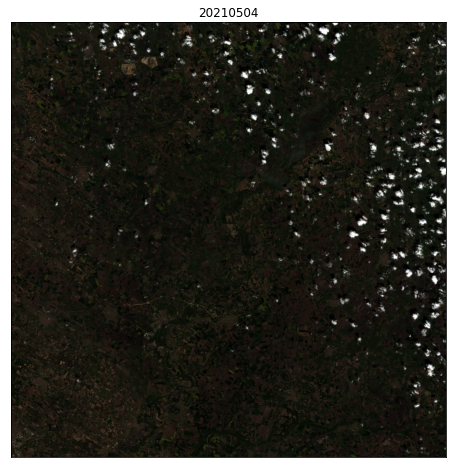

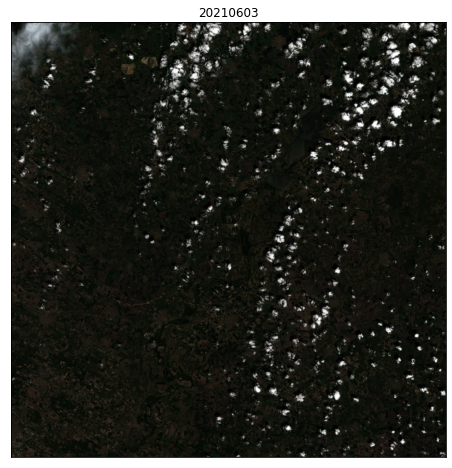

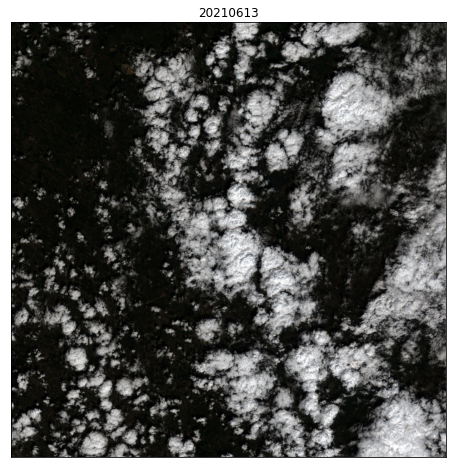

...

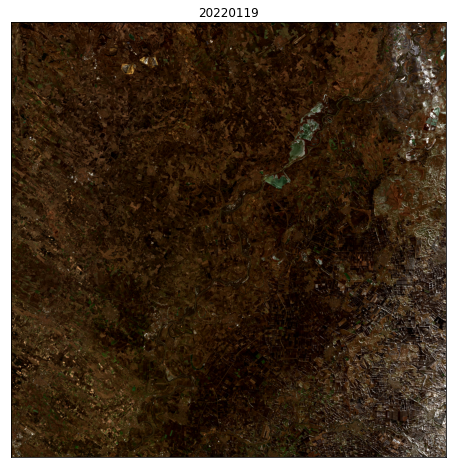

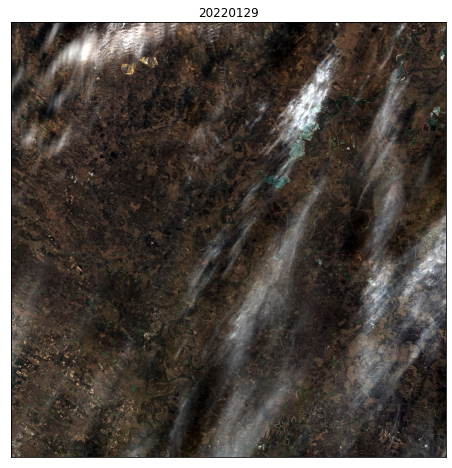

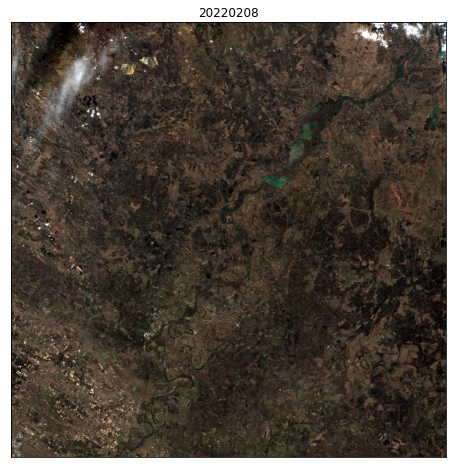

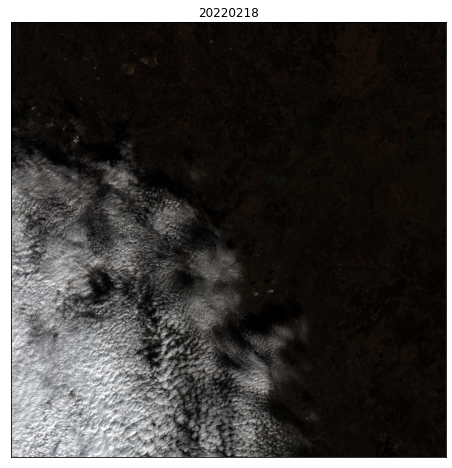

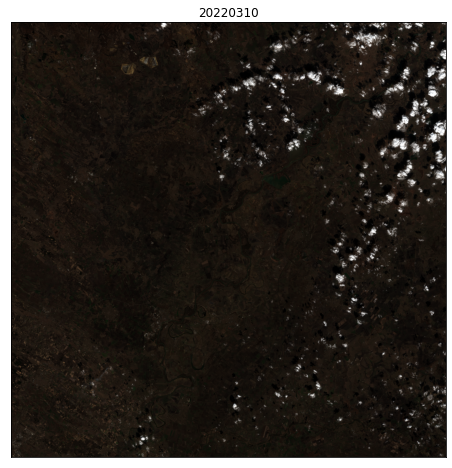

In [149]:
for key,bands in sentinel_bands_dict.items():
    ep.plot_rgb(
        sentinel_bands_dict[key],
        rgb=(3, 2, 1),
        stretch=True,
        str_clip=0.2,
        figsize=(8, 8),
        title=str(key)
)

plt.show()

In [297]:
date_time = '20220129'
band = sentinel_bands_dict[date_time][1,:,:].reshape((-1,1)) # blue band : 2
k_means = cluster.KMeans(n_clusters=2)
k_means.fit(band)

band_cluster = k_means.labels_
band_cluster = band_cluster.reshape(arr_st[1,:,:].shape)

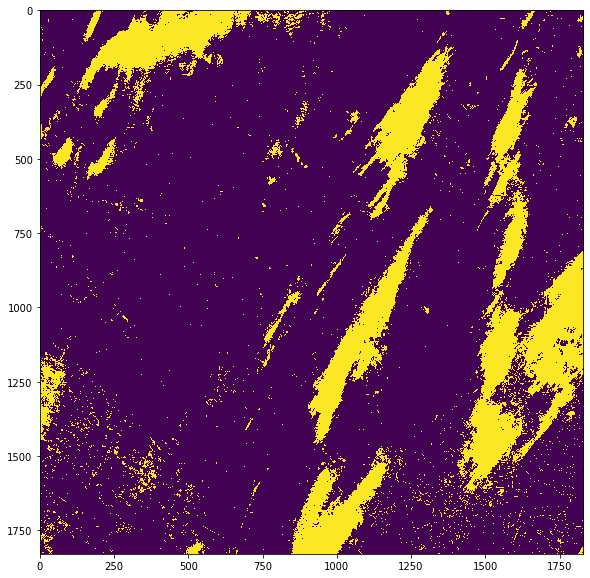

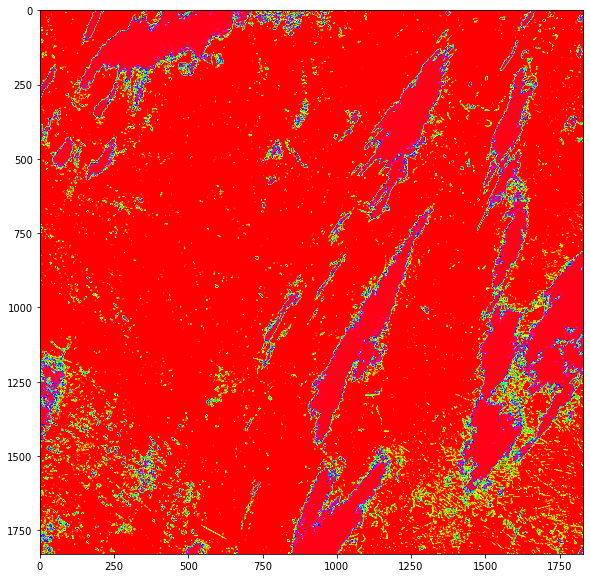

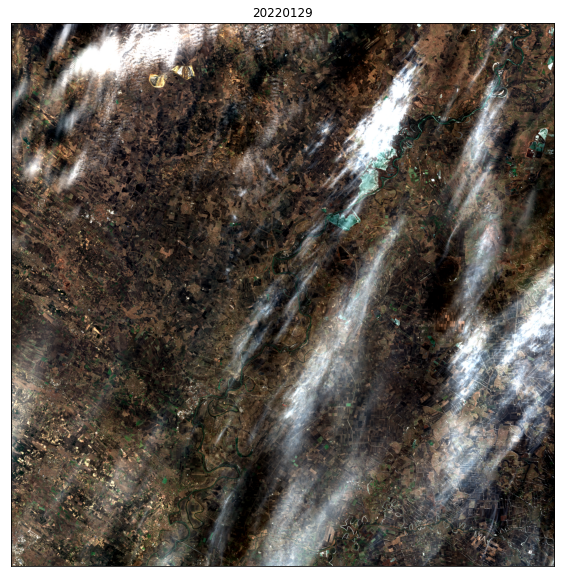

In [298]:
mask = band_cluster == 1

plt.figure(figsize=(10,10))
plt.imshow(mask, interpolation='nearest')

plt.figure(figsize=(10,10))
plt.imshow(band_cluster, cmap='hsv')

ep.plot_rgb(
    sentinel_bands_dict[date_time],
    rgb=(3, 2, 1),
    stretch=True,
    #str_clip=0.2,
    figsize=(10, 10),
    title=str(date_time)
)
plt.show()